# Decision Tree Prediction
We use ToyotaCorolla.csv for this lab.

## Import required packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pylab as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
import statsmodels.api as sm

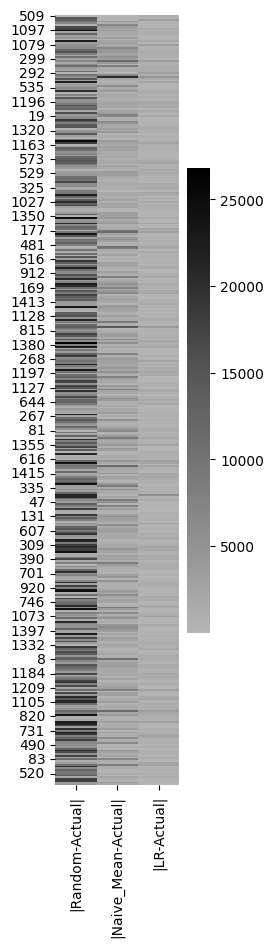

In [2]:
car_df = pd.read_csv('ToyotaCorolla.csv')
Selcelted_Columns = ['Age_08_04', 'KM', 'Fuel_Type', 'HP', 'Met_Color', 'Automatic', 'CC', 
              'Doors', 'Quarterly_Tax', 'Weight','Price']

car_df = car_df[Selcelted_Columns]
predictors = ['Age_08_04', 'KM', 'Fuel_Type', 'HP', 'Quarterly_Tax', 'Weight']
target = 'Price'

Data_X = pd.get_dummies(car_df[predictors], drop_first=True).drop(columns = ['Fuel_Type_Diesel'])
Data_y = car_df.Price

X_train, X_test, y_train, y_test = train_test_split(Data_X,Data_y,  test_size=0.3, random_state=1)

result_df = pd.DataFrame(index=X_test.index, columns=['Random','Naive_Mean','LR','Actual'])
result_df.Actual = y_test

# Method: Naive Mean
result_df.Naive_Mean = y_train.mean()

# Method: Random
result_df.Random = np.random.uniform(y_train.min(), y_train.max(),y_test.shape)

#Method: LR
car_lm = LinearRegression()
car_lm.fit(X_train, y_train)
result_df.LR =car_lm.predict(X_test)


result_df['|Random-Actual|'] = abs(result_df.Random-result_df.Actual)
result_df['|Naive_Mean-Actual|'] = abs(result_df.Naive_Mean-result_df.Actual)
result_df['|LR-Actual|'] = abs(result_df.LR-result_df.Actual)


table = result_df[['|Random-Actual|','|Naive_Mean-Actual|','|LR-Actual|']]

plt.figure(figsize=(2,10))
sns.heatmap(table, center=table.mean().mean(),cmap="Greys")
plt.show()

In [3]:
metric_df = pd.DataFrame(index = ['ME','RMSE', 'MAE','MAPE'] ,
                         columns = ['Random','Naive_Mean','LR'])

n_test = len(result_df)

for m in metric_df.columns:
    metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
    metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
    metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
    metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100
metric_df

,Random,Naive_Mean,LR
ME,-7879.112171,-79.93425,101.679615
RMSE,11862.977596,3560.136378,1247.107503
MAE,9782.247314,2616.745368,966.948202
MAPE,104.783094,24.851242,9.659892


# MLP

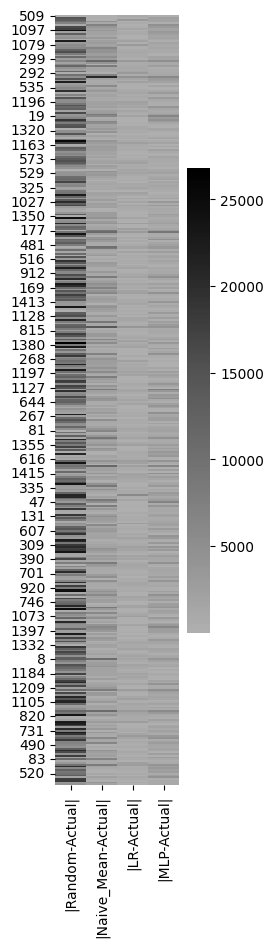

In [4]:
car_mlp = MLPRegressor(hidden_layer_sizes=5,max_iter=2000)
car_mlp.fit(X_train, y_train)

result_df['MLP'] = car_mlp.predict(X_test)
result_df['|MLP-Actual|'] = abs(result_df.MLP-result_df.Actual)

table = result_df[['|Random-Actual|','|Naive_Mean-Actual|','|LR-Actual|','|MLP-Actual|']]

plt.figure(figsize=(2,10))
sns.heatmap(table, center=table.mean().mean(),cmap="Greys")
plt.show()

In [5]:
m='MLP'

metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100

metric_df

,Random,Naive_Mean,LR,MLP
ME,-7879.112171,-79.93425,101.679615,307.984954
RMSE,11862.977596,3560.136378,1247.107503,2197.365564
MAE,9782.247314,2616.745368,966.948202,1705.059497
MAPE,104.783094,24.851242,9.659892,15.941119


In [6]:
# Create tuning (validation) set: devide the trainset

X_train_s, X_tune, y_train_s, y_tune = train_test_split(X_train, y_train, test_size=0.2, random_state=1)

print('X_train Shape: ', X_train.shape)
print('y_train Shape: ', y_train.shape)

print('X_train_s Shape: ', X_train_s.shape)
print('X_tune Shape: ', X_tune.shape)
print('y_train_s Shape: ', y_train_s.shape)
print('y_tune Shape: ', y_tune.shape)

X_train Shape:  (1005, 6)
y_train Shape:  (1005,)
X_train_s Shape:  (804, 6)
X_tune Shape:  (201, 6)
y_train_s Shape:  (804,)
y_tune Shape:  (201,)


# Tune for Randomness


In [7]:
random_options = range(1,10)

tune_df = pd.DataFrame(index = random_options,
                       columns=['RSME'])
tune_df

,RSME
1,NaN
2,NaN
3,NaN
4,NaN
5,NaN
6,NaN
7,NaN
8,NaN
9,NaN


In [8]:
n=len(y_tune)
for random_o in random_options:
    car_mlp = MLPRegressor(hidden_layer_sizes=(10), max_iter=2000,
                               activation='relu',solver='lbfgs', learning_rate='invscaling',
                               learning_rate_init= 0.01, shuffle = False, alpha = 0.00005, random_state=random_o)
    car_mlp.fit(X_train_s, y_train_s)
    y_tune_predict = car_mlp.predict(X_tune)
    RSME = np.sqrt(np.sum((y_tune_predict - y_tune)**2)/n)
    tune_df.at[random_o,'RSME'] = RSME
    print(random_o)

/Users/jason/github/jafarijason/ml_models_deployments/venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


1
2
3
4
5
6
7
8
9


In [9]:
tune_df

,RSME
1,1379.049219
2,1509.688086
3,1396.411256
4,1468.499225
5,1495.994098
6,1467.257876
7,2332.228564
8,1482.455244
9,1466.90128


# Train the tuned MLP on train set

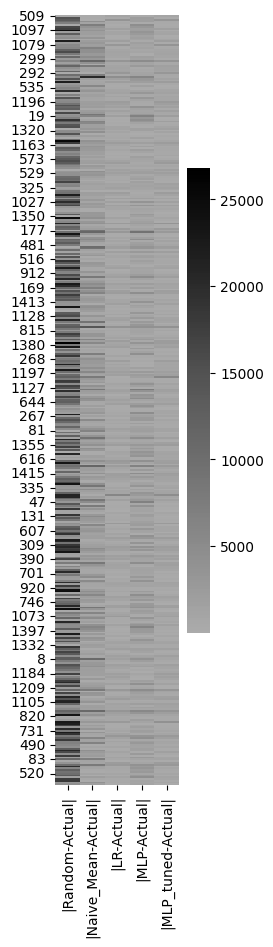

In [10]:
car_mlp = MLPRegressor(hidden_layer_sizes=(10), max_iter=2000,
                               activation='relu',solver='lbfgs', learning_rate='invscaling',
                               learning_rate_init= 0.01, shuffle = False, alpha = 0.00005,random_state=2)

car_mlp.fit(X_train_s, y_train_s)
result_df['MLP_tuned'] = car_mlp.predict(X_test)
result_df['|MLP_tuned-Actual|'] = abs(result_df.MLP_tuned-result_df.Actual)

table = result_df[['|Random-Actual|','|Naive_Mean-Actual|','|LR-Actual|','|MLP-Actual|','|MLP_tuned-Actual|']]

plt.figure(figsize=(2,10))
sns.heatmap(table, center=table.mean().mean(),cmap="Greys")
plt.show()

In [11]:
m='MLP_tuned'

metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100

metric_df

,Random,Naive_Mean,LR,MLP,MLP_tuned
ME,-7879.112171,-79.93425,101.679615,307.984954,111.904072
RMSE,11862.977596,3560.136378,1247.107503,2197.365564,1293.313935
MAE,9782.247314,2616.745368,966.948202,1705.059497,1020.798081
MAPE,104.783094,24.851242,9.659892,15.941119,10.262082


# DT

In [12]:
from sklearn.tree import DecisionTreeRegressor
from dmba import plotDecisionTree

car_dt = DecisionTreeRegressor()
car_dt.fit(X_train,y_train)

plotDecisionTree(car_dt, feature_names=X_train.columns, rotate=True)

no display found. Using non-interactive Agg backend


In [13]:
result_df['DT'] = car_dt.predict(X_test)
result_df['|DT-Actual|'] = abs(result_df.DT-result_df.Actual)

table = result_df[['|Random-Actual|','|Naive_Mean-Actual|','|LR-Actual|','|MLP-Actual|','|MLP_tuned-Actual|','|DT-Actual|']]

plt.figure(figsize=(2,10))
sns.heatmap(table, center=table.mean().mean(),cmap="Greys")
plt.show()

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5885/4126358285.py:8: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [14]:
m='DT'

metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100

metric_df

,Random,Naive_Mean,LR,MLP,MLP_tuned,DT
ME,-7879.112171,-79.93425,101.679615,307.984954,111.904072,-178.431555
RMSE,11862.977596,3560.136378,1247.107503,2197.365564,1293.313935,1441.032498
MAE,9782.247314,2616.745368,966.948202,1705.059497,1020.798081,1101.916473
MAPE,104.783094,24.851242,9.659892,15.941119,10.262082,11.222659


# Tune DT

In [17]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion':['absolute_error','friedman_mse','mae'],
    'splitter' : ['best','random'],
    'max_depth': [50, 60, 70, 80, 90, 100], 
    'min_samples_split': [5, 10, 20, 30, 40], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}

gridSearch = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')
gridSearch.fit(X_train, y_train)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)

Initial score:  -1599975.6436083508
Initial parameters:  {'criterion': 'friedman_mse', 'max_depth': 50, 'min_impurity_decrease': 0.01, 'min_samples_split': 10, 'splitter': 'random'}


/Users/jason/github/jafarijason/ml_models_deployments/venv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
1500 fits failed out of a total of 4500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1500 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/jason/github/jafarijason/ml_models_deployments/venv/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/jason/github/jafarijason/ml_models_deployments/venv/lib/python3.12/site-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/Users/jason/github/jafarijason/ml_mo

In [19]:
param_grid = {
    'criterion':['friedman_mse'],
    'splitter' :  ['random'],
    'max_depth': [96,97,98,99,100,101,102,103,104], 
    'min_samples_split': [16, 18, 20, 22, 24], 
    'min_impurity_decrease': [0.002,0.005 , 0.01, 0.02, 0.03], 
}

gridSearch = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')
gridSearch.fit(X_train, y_train)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)

Initial score:  -1508943.727836425
Initial parameters:  {'criterion': 'friedman_mse', 'max_depth': 96, 'min_impurity_decrease': 0.002, 'min_samples_split': 16, 'splitter': 'random'}


# Tune for Randomness

In [21]:
n=len(y_tune)
random_options = range(1,100)

tune_df = pd.DataFrame(index = random_options,
                       columns=['RSME'])


for random_o in random_options:
    car_dt = DecisionTreeRegressor(criterion='friedman_mse', splitter='random', max_depth=96,
                           min_samples_split = 16, min_impurity_decrease = 0.002, random_state=random_o)
    car_dt.fit(X_train_s, y_train_s)
    y_tune_predict = car_dt.predict(X_tune)
    RSME = np.sqrt(np.sum((y_tune_predict - y_tune)**2)/n)
    tune_df.at[random_o,'RSME'] = RSME

In [22]:
tune_df.RSME.sort_values()

40    1379.996677
59    1384.734454
85    1385.692835
7     1395.556103
4     1395.958233
         ...     
72    1699.762989
45    1714.990687
95    1721.285187
62    1732.728454
75    1930.865634
Name: RSME, Length: 99, dtype: object

# Tuned DT

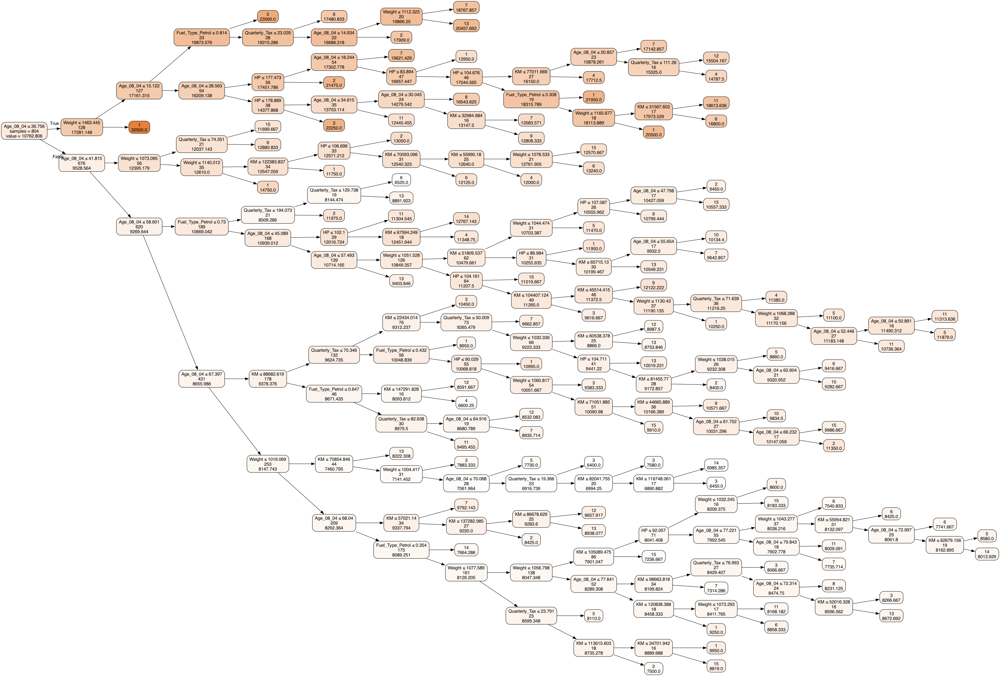

In [27]:
car_dt = DecisionTreeRegressor(criterion='friedman_mse', splitter='random', max_depth=64,
                           min_samples_split = 16, min_impurity_decrease = 0.002, random_state=40)
car_dt.fit(X_train_s, y_train_s)

plotDecisionTree(car_dt, feature_names=X_train.columns, rotate=True)

In [28]:
result_df['DT_tuned'] = car_dt.predict(X_test)
result_df['|DT_tuned-Actual|'] = abs(result_df.DT_tuned-result_df.Actual)

table = result_df[['|Random-Actual|','|Naive_Mean-Actual|','|LR-Actual|','|MLP-Actual|',
                   '|MLP_tuned-Actual|','|DT-Actual|','|DT_tuned-Actual|']]

plt.figure(figsize=(2,10))
sns.heatmap(table, center=table.mean().mean(),cmap="Greys")
plt.show()

/var/folders/kk/xx0ydj0576xgclh1nd3hdlbr0000gn/T/ipykernel_5885/1008950653.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [29]:
m='DT_tuned'

metric_df.at['ME',m]= np.sum((result_df.Actual - result_df[m]))/n_test
metric_df.at['RMSE',m]= np.sqrt(np.sum(result_df.apply(lambda r: (r.Actual - r[m])**2,axis=1))/n_test)
metric_df.at['MAE',m] = np.sum(abs(result_df.Actual - result_df[m]))/n_test
metric_df.at['MAPE',m] = np.sum(result_df.apply(lambda r:abs(r.Actual-r[m])/r.Actual,axis=1))/n_test*100

metric_df

,Random,Naive_Mean,LR,MLP,MLP_tuned,DT,DT_tuned
ME,-7879.112171,-79.93425,101.679615,307.984954,111.904072,-178.431555,-23.754224
RMSE,11862.977596,3560.136378,1247.107503,2197.365564,1293.313935,1441.032498,1249.613355
MAE,9782.247314,2616.745368,966.948202,1705.059497,1020.798081,1101.916473,945.259161
MAPE,104.783094,24.851242,9.659892,15.941119,10.262082,11.222659,9.515297
